## MIIA-4203 MODELOS AVANZADOS PARA ANÁLISIS DE DATOS II


# Aprendizaje por transferencia con redes neuronales 


### Profesor: Camilo Franco (c.franco31@uniandes.edu.co)

En este cuadernos estudiaremos una implementación de aprendizaje por transferencia utilizando la red pre-entrenada VGG-16. Implementaremos nuestra propio modelo de aprendizaje por trasferencia utilizando la biblioteca (API) Keras (https://keras.io/). 

Finalmente evaluaremos si un modelo más complejo de *deep learning* nos permite lograr un mejor desempeño para la detección automática de frailejones sobre imagenes aereas del páramo.

## Estudiantes:

- Ivan Galindo Gaviria Cod: 201924193

- Jonny Coronel Villamil Cod: 201411692

- Sergio Ardila Rodríguez Cod: 201924139

Primero importemos algunos de los paquetes que vamos a utilizar, junto con las imagenes de entrenamiento:


In [1]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

from ImportImagenesRGB import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix 

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from prettytable import PrettyTable
import datetime

import keras
from keras.models import Sequential, load_model
from keras.optimizers import SGD
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
from keras import applications

from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

Using TensorFlow backend.


In [2]:
X,Y = import_imagenes_RGB()

print(X.shape, Y.shape, X[0,0,0])

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


**Salida esperada:**

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


## 1. Aprendizaje por transferencia

En pocas palabras, el aprendizaje por transferencia tiene su historia en la psicología, refiriendose a situaciones donde las personas aplican concimiento, estrategias y aptitudes que han aprendido previamente para enfrentar una nueva situación bajo un contexto **relacionado**. Dentro del aprendizaje computacional, este tipo de aprendizaje se enfoca en guardar un tipo de conocimiento que ya se ha mostrado útil para resolver un problema, y aplicarlo para resolver otro problema distinto pero **relacionado**.

Hay que tener en cuenta que si un modelo de transferencia tiene un efecto negativo sobre el desempeño del modelo, entonces tendremos una transferencia negativa (lo cual no es deseable). De este modo, el reto de los métodos de transferencia es el de producir una transferencia positiva entre tareas apropiadamente relacionadas, evitando transferencias negativas entre tareas poco relacionadas (ver Torrey & Shavlik (2009) Transfer learning). 

El ejemplo que vamos a ver a continuación es un tipo de aprendizaje por transferencia inductivo, característico de las redes neuronales, el cual se ajusta de acuerdo con la coincidencia de un conocimiento previo sobre la fuente de información y la tarea que se propone solucionar. En particular, vamos a llevar a cabo un *aprendizaje por transferencia inductivo-jerárquico*, buscando soluciones a tareas sencillas mediante la combinación de herramientas desarrolladas para tareas más complejas. Entonces, usamos el aprendizaje de una red pre-entrenada, la VGG-16, para aprovechar su conocimiento sobre formas, contornos, bordes, etc. que podemos hacer propias para terminar de entender mejor el problema de clasificación de frailejones, y esperamos mejorar el desempeño de los modelos.


### VGG-16

La red VGG-16 fue propuesta por Simonyan & Zisserman (2015) en Very deep CNN for large-scale image recognition, siguiendo los principios presentados en Ciresan et al. (2011): Flexible, High Performance Convolutional Neural Networks for Image Classification.

La arquitectura de la VGG-16 le permitió ganar la competición ILSVR(Imagenet) 2014 (http://www.image-net.org/challenges/LSVRC/2014/results). Los principios de esta arquitectura consisten en considerar filtros convolucionales pequeños (de $3\times 3$), que recorren las imagenes exhaustivamente, con un *stride* de 1, y capas de *max-poling* de $2\times 2$, reduciendo en gran medida el número de hiper-parámetros a optimizar. La red VGG-16 es bastante profunda, con una configuración de 16 capas (con aprox. 138 millones de parámetros): para las primeras 14 capas combina capas convolucionales y capas de agregación, y al final tiene 2 capa densamente conectadas seguidas de una capa de salida *softmax* para clasificación de múltiples clases (ver: https://neurohive.io/en/popular-networks/vgg16/).


Implementemos nuestro ejemplo de aprendizaje por transferencia utilizando la red VGG-16, la cual ha sido entrenada previamente con imagenes RGB y que podemos descargar directamente de Keras:

In [3]:
model0   = applications.VGG16(include_top=False, weights='imagenet')
config_transI = model0.get_config()


58892288/58889256 [==============================] - 6s 0us/step


Pasamos nuestro conjunto de datos por la red, obteniendo los nuevos patrones de acuerdo con el entendimiento de la red convolucional VGG-16 acerca de las nociones más básicas que encuentra en nuestras imagenes del Páramo:

In [4]:
feat_X = model0.predict(X)

Agregamos unas pocas capas finales para afinar el modelo por transferencia para la tarea específica de detección de imagenes aereas del Páramo:

In [6]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

Y entrenamos esas capas finales:

In [7]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   |  1.0   | 0.9737 |   99  |
+--------+--------+--------+-------+


Graficamos el desempeño del modelo:

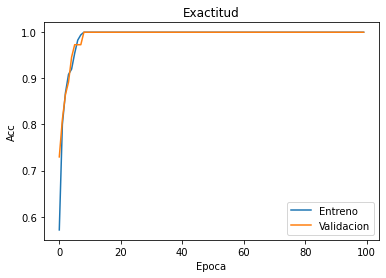

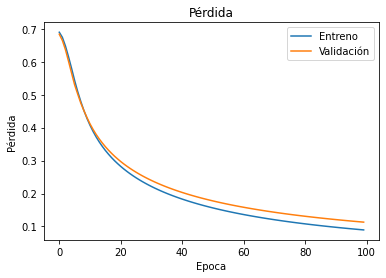

In [8]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

Cargamos el mejor modelo y confirmamos el desempeño del modelo sobre todo el conjunto de datos:

In [9]:
# red convolucional
model_4 = load_model('Transfer_Adam_partseed=1.h5')

model_4.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 10245     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 6         
Total params: 10,251
Trainable params: 10,251
Non-trainable params: 0
_________________________________________________________________


Veamos el desempeño del mejor modelo sobre todo el conjunto de datos:

In [10]:
Y_pred = model_4.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[144,   1],
       [  0, 105]], dtype=int64)

**Salida esperada:**
    
<table style="width:20%">
    <tr>
       <td> 144 </td>
       <td> 1 </td>
    </tr>
    <tr>
       <td> 0 </td>
       <td> 105 </td>
    </tr>

</table>

Podemos observar que el desempeño del modelo a mejorado bastante. 

### Ejercicio 1.1

Encuentre el mejor modelo examinando una configuración distinta para las capas de salida, o siguiendo alguna otra estrategia como puede ser cambiando el optimizador o las funciones de activación.

#### 1.1.1. Modelo RMSProp

In [34]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

modelrm = Sequential()  
modelrm.add(Flatten(input_shape=feat_X.shape[1:]))  
modelrm.add(Dense(20, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
modelrm.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = modelrm.get_config()

In [35]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del RMSProp
rmsprop = keras.optimizers.RMSprop(lr=0.001, rho=0.9)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    modelrm = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    modelrm.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=modelrm.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    modelrm.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = modelrm.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = modelrm.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = modelrm.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_rmsprop_partseed='+str(r)+'.h5')
        modelrm.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 95 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   95  |
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   |  1.0   | 0.9737 |   99  |
+--------+--------+--------+-------+


Al realizar un cambio en la configuración de las capas de salida, combinándolo con un modelo RMSProp, podemos ver que entre más neuronas se agreguen en esta capa final, menos épocas requiere para encontrar el mejor accuracy.

#### 1.1.2. Modelo SGD

In [36]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del SGD
sgd = keras.optimizers.SGD(lr=0.01, momentum=0.001)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    modelrm = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    modelrm.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=modelrm.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    modelrm.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = modelrm.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = modelrm.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = modelrm.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_sgd_partseed='+str(r)+'.h5')
        modelrm.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 99 , accu_v1=0.7567567825317383 , accu_v2=0.8157894611358643
Epoca= 99 , accu_v1=0.8108108043670654 , accu_v2=0.8421052694320679
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.6057 | 0.4324 | 0.6053 |   0   |
| 0.8571 | 0.7568 | 0.8158 |   99  |
| 0.8286 | 0.8108 | 0.8421 |   99  |
+--------+--------+--------+-------+


Revisando la configuración modificada para las capas de salida, pero con un modelo SGD (Gradiente Descendiente Estocástico) no se encuentra mejora al modelo, por lo contrario, suele disminuír en accuracy para los distintos datasets creados.

#### Cambios en la configuración de las capas de salida y funciones de activación

A continuación, se realizaron pruebas teniendo en cuenta la función de activación de las neuronas:

- Prubeba 1 : Se realizó un cambio en la función de activación de la sigmoide a tangente hiperbólica y con un optimizador Adam, sin embargo se vio una disminución en el accuracy del modelo.
- Prueba 2 : Se realizó un cambio en la función de activación de la sigmoide a la relu en cada una de las capas, sin embargo se vio una disminución en el accuracy del modelo.
- Prueba 3 :  Se realizó un cambio en la función de activación de la sigmoide a la relu solamente en la capa de salida, Esto nos permite ver una mejora en el accuracy para el dataset 1, y mejorando la cantidad de épocas para llegar al mejor accuracy en los dataset 2 y 3.

In [52]:
#Inicialización con la función de activación sigmoide - Relu
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model3 = Sequential()  
model3.add(Flatten(input_shape=feat_X.shape[1:]))  
model3.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model3.add(Dense(1, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model3.get_config()

In [53]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del RMSProp
rmsprop = keras.optimizers.RMSprop(lr=0.001, rho=0.9)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model3 = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model3.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model3.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model3.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model3.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model3.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model3.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_rmsprop_partseed='+str(r)+'.h5')
        model3.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 65 , accu_v1=0.9729729890823364 , accu_v2=0.9473684430122375
Epoca= 73 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 73 , accu_v1=0.9729729890823364 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9474 |   65  |
|  1.0   | 0.973  | 0.9211 |   73  |
|  1.0   | 0.973  | 0.9737 |   73  |
+--------+--------+--------+-------+


## 2. Caso aplicado

Ahora probemos nuestro modelo sobre la imagen completa de prueba del paramo ``IMG_3451.JPG``.


In [74]:
from keras.preprocessing.image import image

img = image.load_img('IMG_3451.JPG')
#img 

### 2.1 Red sencilla

In [76]:
# red sencilla 5 neuronas
model_1 = load_model('modelo_redsencilla_initseed=1_part_seed=3numn=5.h5')

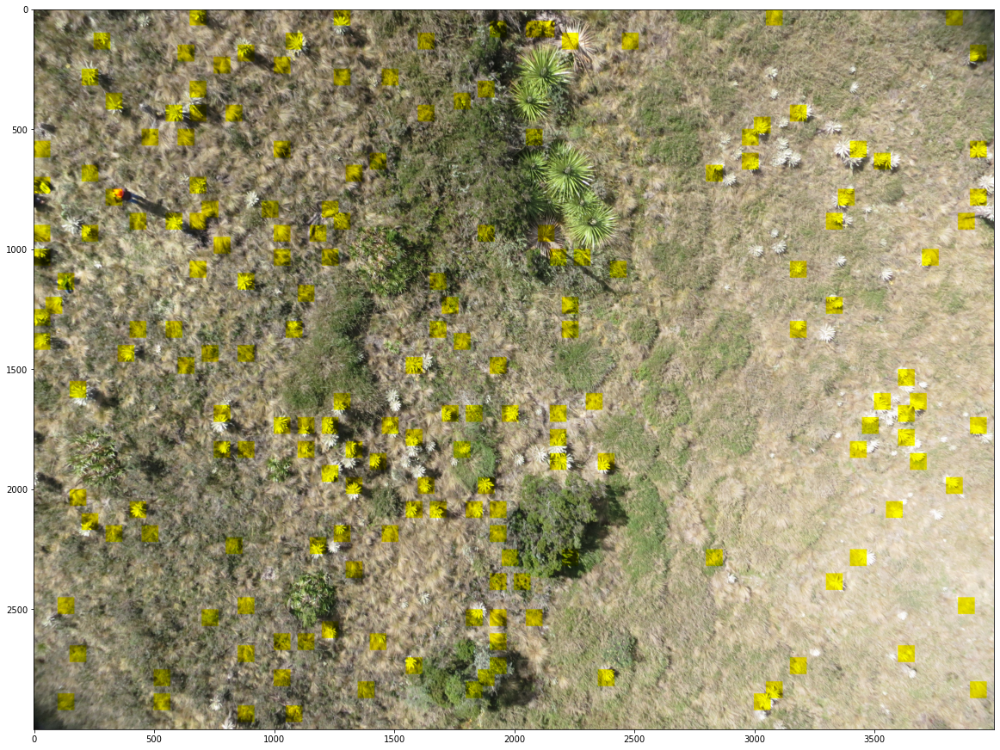

In [77]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_1.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.2 Red multi-capa

In [78]:
# red profunda de 6 capas
model_2 = load_model('modelo_redprofunda_initseed=1_part_seed=8_Init=Normal.h5')

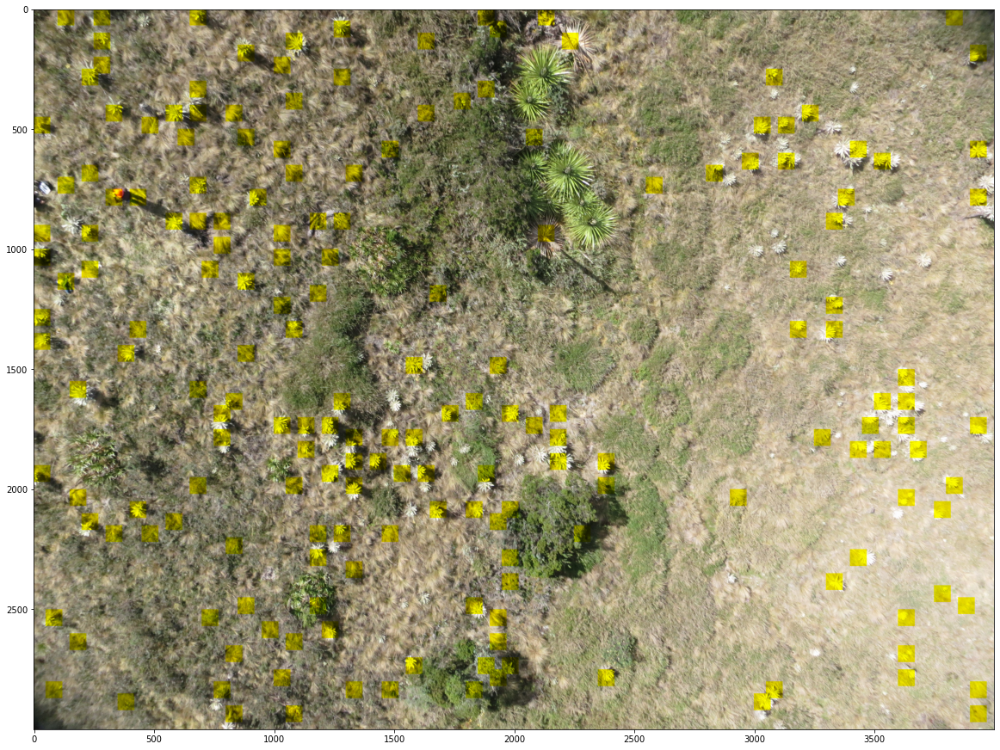

In [79]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_2.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.3 Red Convolucional

In [80]:
# red convolucional sencilla
model_3 = load_model('modelo_CNN_initseed=1_part_seed=3.h5')

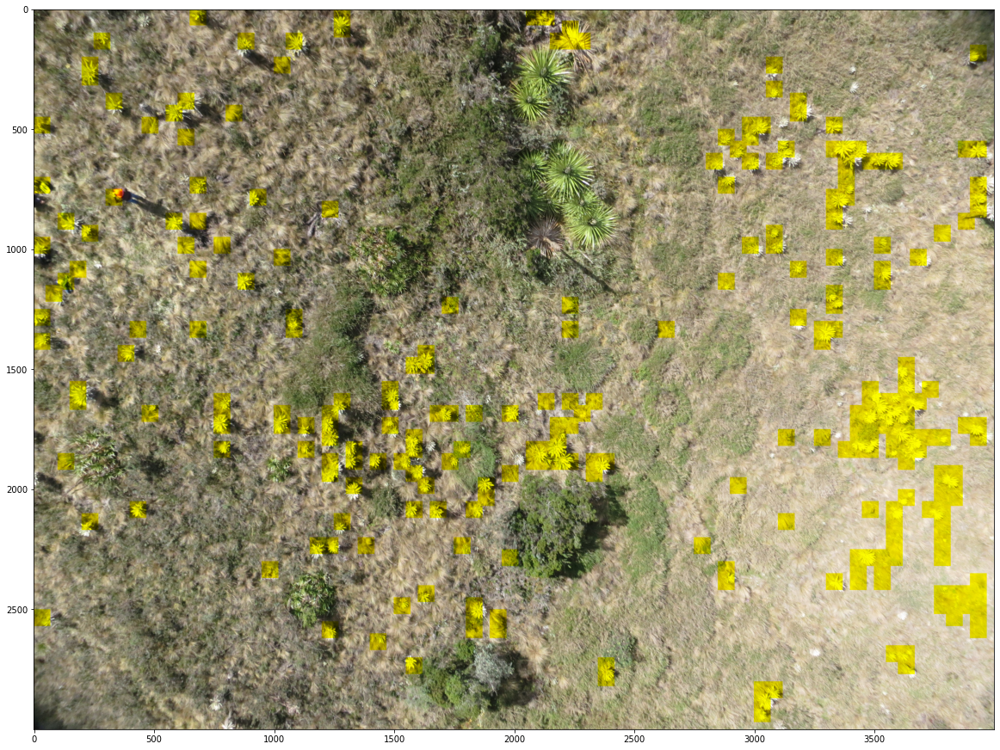

In [81]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_3.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.4 Red Convolucional VGG-16 con transferencia

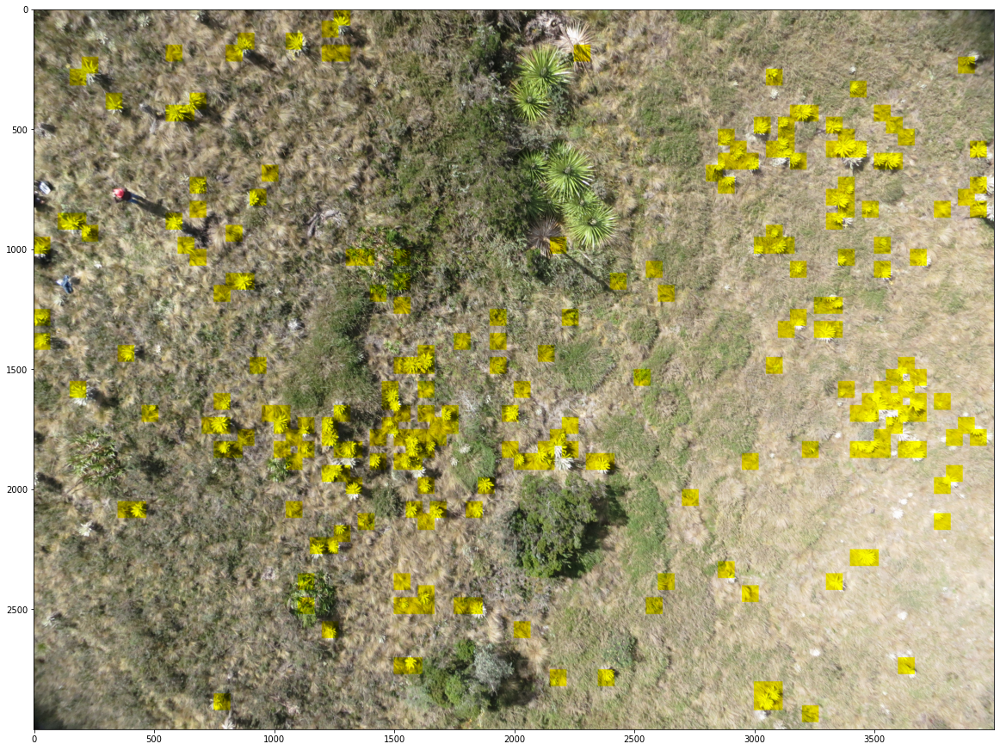

In [82]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_4.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### Pregunta 2.1

¿Qué puede observar sobre el desempeño de los diferentes modelos? Argumente cuál es el mejor modelo para poner en producción.

- Modelo Red Sencilla: Este modelo logra identificar con cierta eficacia los frailejones, y logra detectar lo que no es frailejón para apartarlo (podría decirse que clasifica correctamente los verdaderos negativos) sin embargo, para identificar los verdaderos positivos, aun hace falta mayor eficacia, pues se nota que está dejando de identificar frailejones que por la imagen se podrían identificar a simple vista.
Cuando existen varios frailejones concentrados, sólo logra identificar uno de ellos.

- Modelo Red Multi Capa: Logra idenfificar mucho mejor los frailejones cuando estos se encuentran concentrados en zonas, permitiendo una mejora en la eficiencia de clasificación, generando un avance respecto a la medida de efectividad que presentaba el modelo de red sencilla.

- Modelo de Red Convolucional: En zonas de alta población de frailejones, se nota su mejora en la clasificación, sin embargo, se nota que para el modelo en el cual existen amplias zonas sin frailejones, los clasifica incorrectamente (presenta un problema de baja espeficidad, dado que clasificó como frailejón, varios que no eran). 

- Modelo Red VGG-16 con transferencia: Clasifica altamente bien los frailejones, mejora el problema que se tenia de la falsa clasificación de frailejones, aunque se dejan de lado pocos frailejones para clasificar, es el modelo que mayor estabiliza la clasificación, tiene una mejor eficacia y a simple vista por la imagen, logra identificarlos correctamente. Este sería el mejor modelo para poner en producción.


### Ejercicio 2.2

Investigue otra red pre-entrenada dsitinta a la VGG-16 e implemente el aprendizaje por transferencia para la deteccion de frailejones. Argumente por qué su justifica el aprendizaje por transferencia con base en el modelo pre-entrenado de su elección (cómo se relacionan la tarea base y la segunda tarea objetivo).

#### Modelo ResNet 50

El Modelo ResNet se basa en aumentar el número de capas, y a su vez realiza una conexión residual, para ello, internametne está realizando una capa identidad, de esta manera busca mejorar el proceso de aprendizaje entre cada capa.

Dado que la imagen contiene mayor número de pixeles a la cantidad mínima exigida por ResNet, no es necesario realizar ajuste alguno a las dimensiones de la misma, de manera que los parámetros del ResNet se mantienen por defecto, excepto el "include_top", dado que por temas de dimensionalidad, se define como "False".

ResNet cuenta con 25'636.712 parámetros, menor cantidad que el VGG16 que es el modelo base a estudiar, sin embargo este modelo de aprendizaje sirve para el tratamiento y clasificación de imágenes.

In [70]:
#Creacion de modelo ResNet 50

modelb   = applications.ResNet50(include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000)
config_transA = modelb.get_config()

C:\Users\Sergio\Anaconda3\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 13s 0us/step


In [71]:
feat_X = modelb.predict(X)

In [72]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

modelb = Sequential()  
modelb.add(Flatten(input_shape=feat_X.shape[1:]))  
modelb.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
modelb.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = modelb.get_config()

In [73]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    modelb = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    modelb.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=modelb.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    modelb.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = modelb.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = modelb.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = modelb.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adamres_partseed='+str(r)+'.h5')
        modelb.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.7027027010917664 , accu_v2=0.7631579041481018
Epoca= 0 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 2 , accu_v1=0.5405405163764954 , accu_v2=0.6315789222717285
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  0.88  | 0.7027 | 0.7632 |   99  |
|  0.6   | 0.4595 | 0.6053 |   0   |
| 0.5771 | 0.5405 | 0.6316 |   2   |
+--------+--------+--------+-------+


#### Conclusiones del modelo ResNet 50


- El modelo ResNet para esta cantidad de epocas predeterminadas, no consigue mejorar el accuracy establecido, esto puede ser dada la cantidad de parámetros que puede tomar, dado que es menor que el VGG 16 el cual es nuestro punto de referencia.

- Se puede tomar como alternativa el modelo ResNet ampliándo la cantidad de epocas máximas a considerar, igualmente, el uso de las funciones ReLU en las capas de salida pueden mejorar el rendimiento.

- Al utilizar modelos como el NASNetLarge, no se logran ejecutar por problemas de dimensionalidad en la implementación. Lo cual nos puede ayudar a tomar como alternativa el ResNet 50, dado que también se acopla a las dimensiones que exige el problema, y que como oportunidad, se trabajará con la mejora de parámetros ideales.

### Ejercicio 2.3
Construya un algoritmo que utilice el mejor modelo de red neuronal para la detección de poblaciones en la imagen completa IMG_3451.JPG, y estime la densidad para cada población detectada.

*Ayuda:* Mediante un procedimiento sencillo, primero detecte las poblaciones de frailejones y luego estime su densidad, calculada como el numero de frailejones por area poblada.

#### Respuesta

En la primera imagen de 500x500 existe una densidad de 3 frailejones por área calculada o poblada (en este caso, se identifica que son 100 registros, de los cuales 3 fueron frailejones), de esta manera se llega a identificar la densidad establecida, convirtiéndose en una métrica para el modelo.

En la imagen de muestra, se evidencia este cálculo de 3 frailejones sobre los 100 de área poblada, lo cual es la densidad en el área.

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


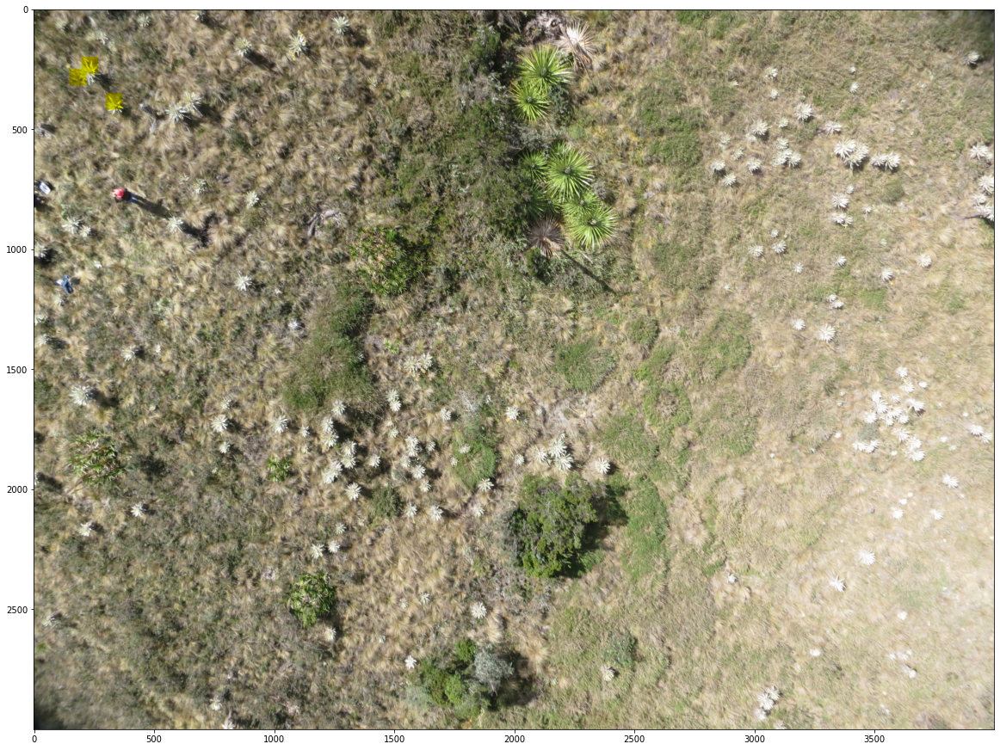

In [89]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,500,50):
    c1=0
    c2=70
    for j in range(1,500,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_4.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
            A = 1
        else:
            A = 0
        print(A)    
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)